In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Using GPU CUDA for Model Training
!nvidia-smi

Thu May 16 05:19:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import seaborn as sns

In [8]:
from pathlib import Path
import numpy as np
import pandas as pd
from skimage.io import imread as imread
from skimage.util import montage as montage2d
from skimage.color import label2rgb
from PIL import Image
base_dir = '/content/drive/MyDrive/HAM10000_images_part_1'

In [9]:
import pandas as pd
from pathlib import Path

# Load the CSV file
image_overview_df = pd.read_csv('/content/drive/MyDrive/HAM10000_images_part_1/HAM10000_metadata.csv')

# Convert the base directory string to a Path object
base_dir = Path('/content/drive/MyDrive/HAM10000_images_part_1')

# Create a dictionary mapping image IDs to their file paths
all_image_ids = {c_path.stem: c_path for c_path in base_dir.glob('**/*.jpg')}

# Map the image paths to the DataFrame
image_overview_df['image_path'] = image_overview_df['image_id'].map(all_image_ids.get)

# Remove rows with missing values
image_overview_df.dropna(inplace=True)

# Print the number of image-recipe pairs loaded
print(image_overview_df.shape[0], 'image, recipe pairs loaded')

# Display a sample of the DataFrame
print(image_overview_df.sample(3))


231 image, recipe pairs loaded
        lesion_id      image_id   dx    dx_type   age     sex localization  \
7081  HAM_0003951  ISIC_0024317   nv      histo  35.0  female      abdomen   
5532  HAM_0002847  ISIC_0024353   nv  follow_up  50.0    male        trunk   
2271  HAM_0007530  ISIC_0024410  mel      histo  30.0    male        chest   

                                             image_path  
7081  /content/drive/MyDrive/HAM10000_images_part_1/...  
5532  /content/drive/MyDrive/HAM10000_images_part_1/...  
2271  /content/drive/MyDrive/HAM10000_images_part_1/...  


In [10]:
image_overview_df.drop(['age'], axis=1).describe()

,lesion_id,image_id,dx,dx_type,sex,localization,image_path
count,231,231,231,231,231,231,231
unique,230,231,7,4,2,13,231
top,HAM_0002450,ISIC_0024324,nv,follow_up,male,lower extremity,/content/drive/MyDrive/HAM10000_images_part_1/...
freq,2,1,151,109,139,64,1


In [11]:
dx_name_dict = {
    'nv': 'melanocytic nevi',
    'mel': 'melanoma',
    'bcc': 'basal cell carcinoma',
    'akiec': 'Actinic keratoses and intraepithelial carcinoma',
    'vasc': 'vascular lesions',
    'bkl': 'benign keratosis-like',
    'df': 'dermatofibroma'
}
image_overview_df['dx_name'] = image_overview_df['dx'].map(dx_name_dict.get)
dx_name_id_dict = {name: id for id, name in enumerate(dx_name_dict.keys())}
image_overview_df['dx_id'] = image_overview_df['dx'].map(dx_name_id_dict.get).astype(int)
image_overview_df.sample(3)

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id
5794,HAM_0003239,ISIC_0024533,nv,follow_up,45.0,male,hand,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0
9852,HAM_0005650,ISIC_0024522,akiec,histo,65.0,male,lower extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,Actinic keratoses and intraepithelial carcinoma,3
4790,HAM_0004415,ISIC_0024532,nv,follow_up,40.0,male,abdomen,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0


In [12]:
image_overview_df['dx_name'].value_counts()

dx_name
melanocytic nevi                                   151
benign keratosis-like                               28
basal cell carcinoma                                18
melanoma                                            16
Actinic keratoses and intraepithelial carcinoma     10
dermatofibroma                                       4
vascular lesions                                     4
Name: count, dtype: int64

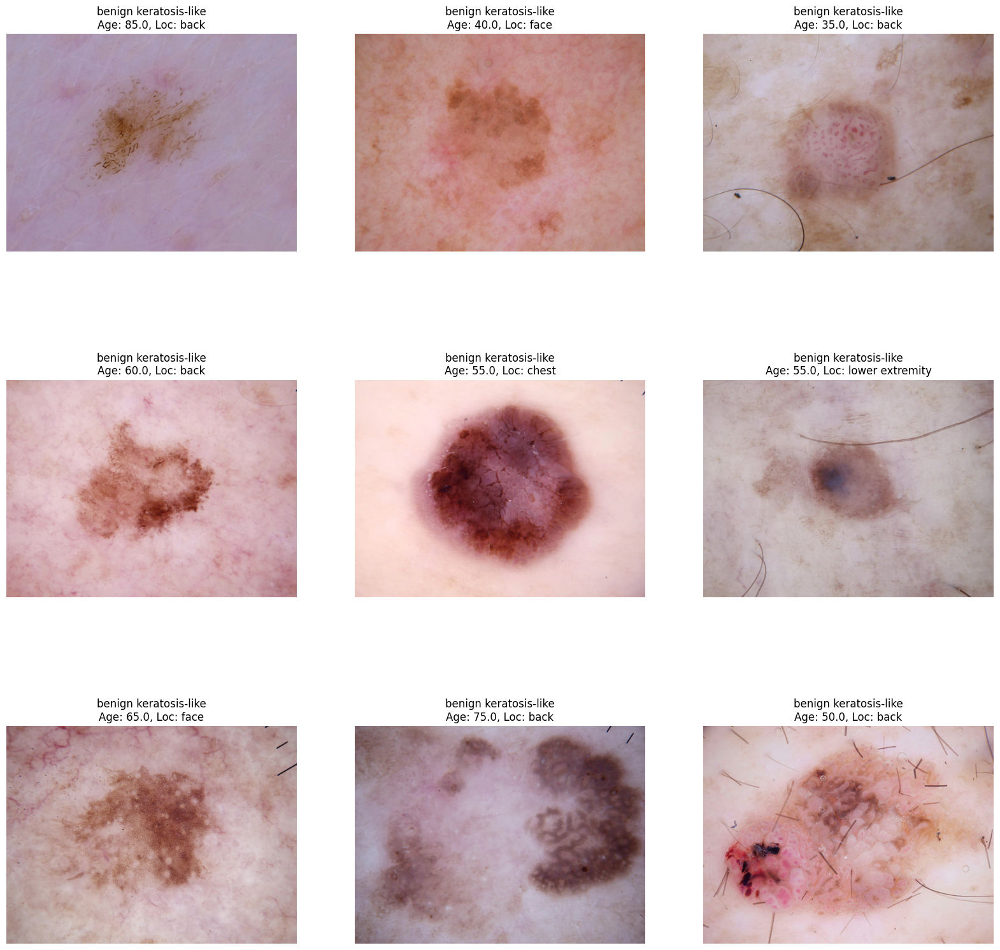

In [13]:

fig, m_axs = plt.subplots(3, 3, figsize=(20, 20))
for c_ax, (_, c_row) in zip(m_axs.flatten(),
                            image_overview_df.head(9).iterrows()):
    c_ax.imshow(imread(c_row['image_path']))
    c_ax.set_title('{dx_name}\nAge: {age}, Loc: {localization}'.format(**c_row))
    c_ax.axis('off')

In [14]:
test_row = image_overview_df.iloc[1]
print(test_row)

lesion_id                                             HAM_0000364
image_id                                             ISIC_0024505
dx                                                            bkl
dx_type                                                     histo
age                                                          40.0
sex                                                        female
localization                                                 face
image_path      /content/drive/MyDrive/HAM10000_images_part_1/...
dx_name                                     benign keratosis-like
dx_id                                                           5
Name: 334, dtype: object


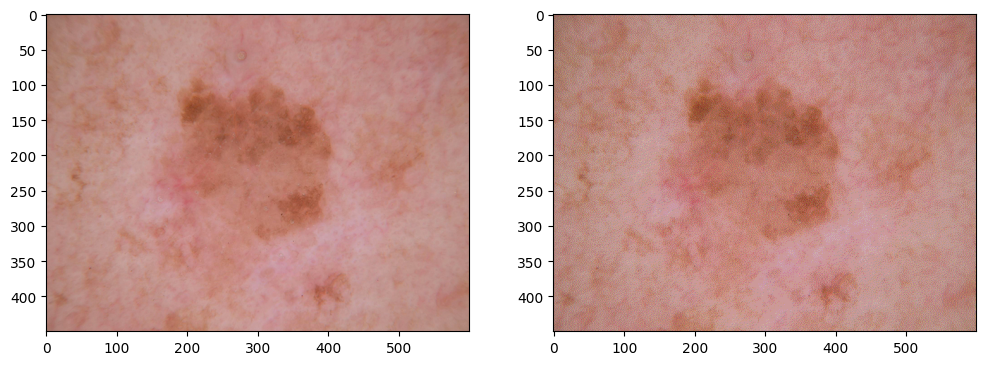

In [15]:
test_image = Image.open(test_row['image_path']) # normal image
# convert to 8bit color (animated GIF) and then back
web_image = test_image.convert('P', palette='WEB', dither=None)
few_color_image = web_image.convert('RGB')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(test_image)
ax2.imshow(few_color_image)

In [16]:
print('Unique colors before', len(set([tuple(rgb) for rgb in np.array(test_image).reshape((-1, 3))])))
print('Unique colors after', len(set([tuple(rgb) for rgb in np.array(few_color_image).reshape((-1, 3))])))

Unique colors before 13331
Unique colors after 29


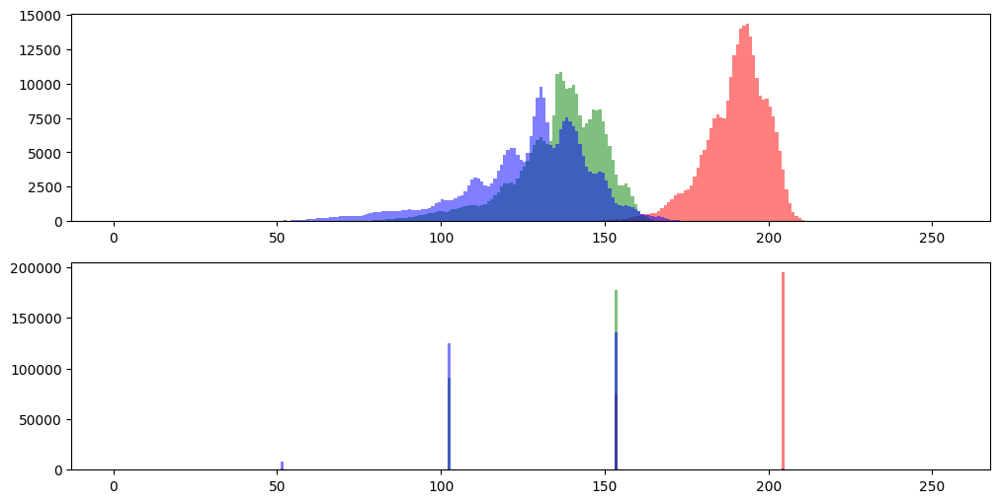

In [17]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
for c_channel, c_name in enumerate(['red', 'green', 'blue']):
    ax1.hist(np.array(test_image)[:, :, c_channel].ravel(),
             color=c_name[0],
             label=c_name,
             bins=np.arange(256),
             alpha=0.5)
    ax2.hist(np.array(few_color_image)[:, :, c_channel].ravel(),
             color=c_name[0],
             label=c_name,
             bins=np.arange(256),
             alpha=0.5)

In [18]:
idx_to_color = np.array(web_image.getpalette()).reshape((-1, 3))/255.0

Text(0, 0.5, 'Pixel Count')

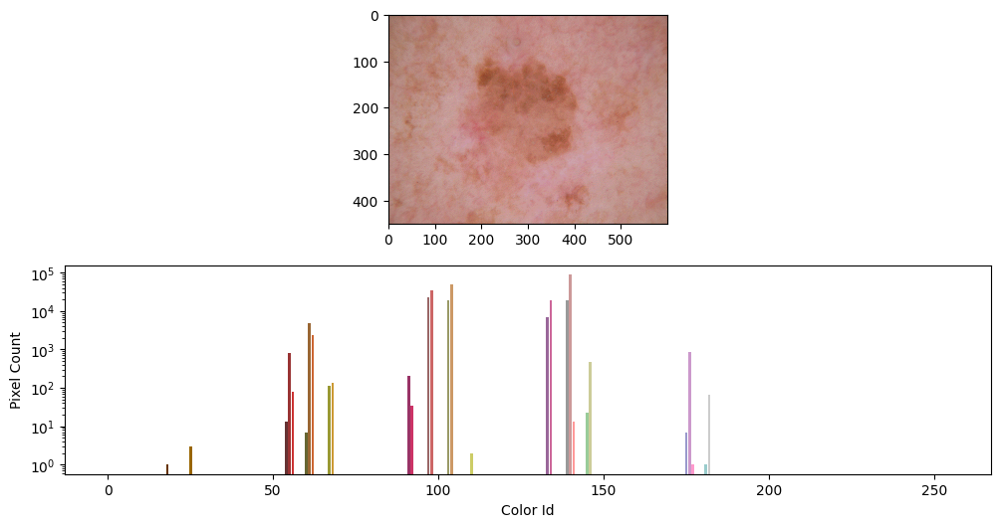

In [19]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
ax1.imshow(few_color_image)
counts, bins = np.histogram(web_image, bins=np.arange(256))
for i in range(counts.shape[0]):
    ax2.bar(bins[i], counts[i], color=idx_to_color[i])
ax2.set_yscale('log')
ax2.set_xlabel('Color Id')
ax2.set_ylabel('Pixel Count')

In [20]:
def color_count_feature(in_path):
    raw_image = Image.open(in_path)
    web_image = raw_image.convert('P', palette='WEB', dither=None)
    counts, bins = np.histogram(np.array(web_image).ravel(), bins=np.arange(256))
    return counts*1.0/np.prod(web_image.size) # normalize output

In [21]:
%%time
image_subset_df = image_overview_df.sample(100).copy()
image_subset_df['color_features'] = image_subset_df['image_path'].map(color_count_feature)
image_subset_df.sample(3)

CPU times: user 2.12 s, sys: 36.9 ms, total: 2.16 s
Wall time: 3.23 s


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
9931,HAM_0002954,ISIC_0024329,akiec,histo,75.0,female,lower extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,Actinic keratoses and intraepithelial carcinoma,3,"[0.00013333333333333334, 0.0, 0.0, 0.0, 0.0, 0..."
7081,HAM_0003951,ISIC_0024317,nv,histo,35.0,female,abdomen,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
382,HAM_0000933,ISIC_0024358,bkl,histo,60.0,female,back,/content/drive/MyDrive/HAM10000_images_part_1/...,benign keratosis-like,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


<ipython-input-22-bb03af60bac2>:8: RuntimeWarning: invalid value encountered in divide
  ax2.imshow(combined_features/color_wise_average, vmin=0.05, vmax=20)


Text(0, 0.5, 'Frequency')

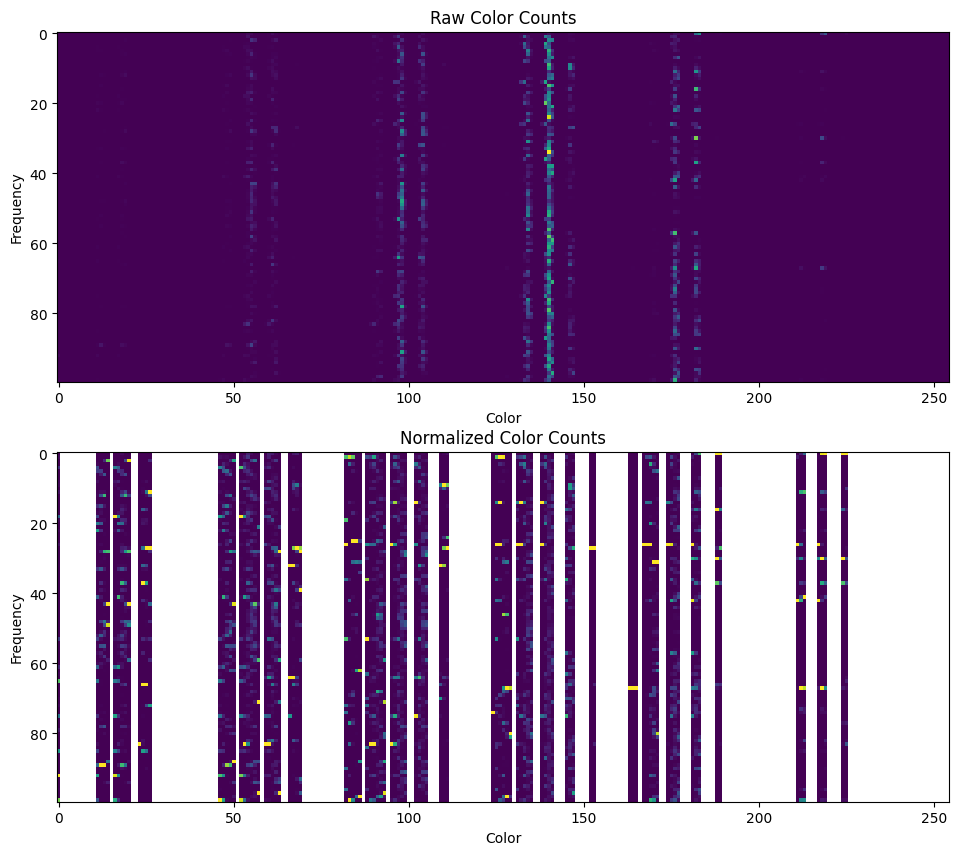

In [22]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))
combined_features = np.stack(image_subset_df['color_features'].values, 0)
ax1.imshow(combined_features)
ax1.set_title('Raw Color Counts')
ax1.set_xlabel('Color')
ax1.set_ylabel('Frequency')
color_wise_average = np.tile(np.mean(combined_features, 0, keepdims=True), (combined_features.shape[0], 1))
ax2.imshow(combined_features/color_wise_average, vmin=0.05, vmax=20)
ax2.set_title('Normalized Color Counts')
ax2.set_xlabel('Color')
ax2.set_ylabel('Frequency')

In [23]:
from sklearn.decomposition import PCA
xy_pca = PCA(n_components=2)
xy_coords = xy_pca.fit_transform(combined_features)
image_subset_df['x'] = xy_coords[:, 0]
image_subset_df['y'] = xy_coords[:, 1]

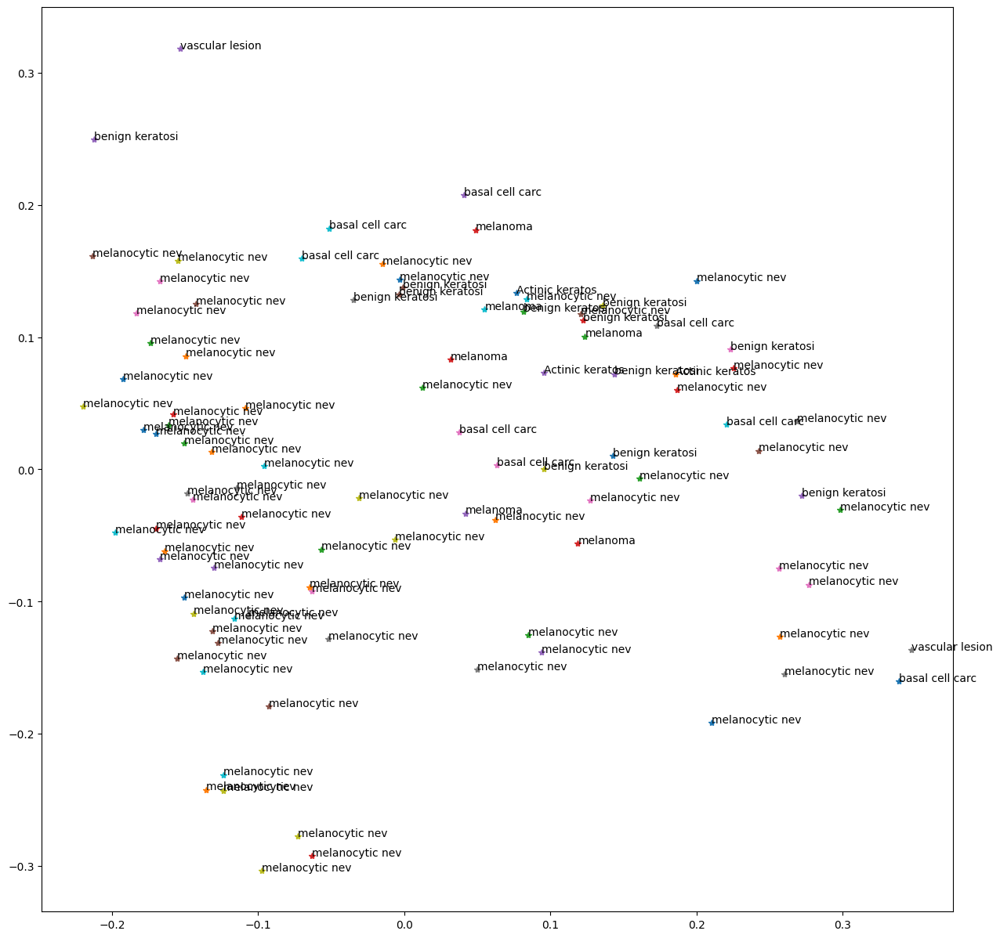

In [24]:
fig, ax1 = plt.subplots(1,1, figsize=(15, 15))
for _, c_row in image_subset_df.iterrows():
    ax1.plot(c_row['x'], c_row['y'], '*')
    ax1.text(s=c_row['dx_name'][:15], x=c_row['x'], y=c_row['y'])

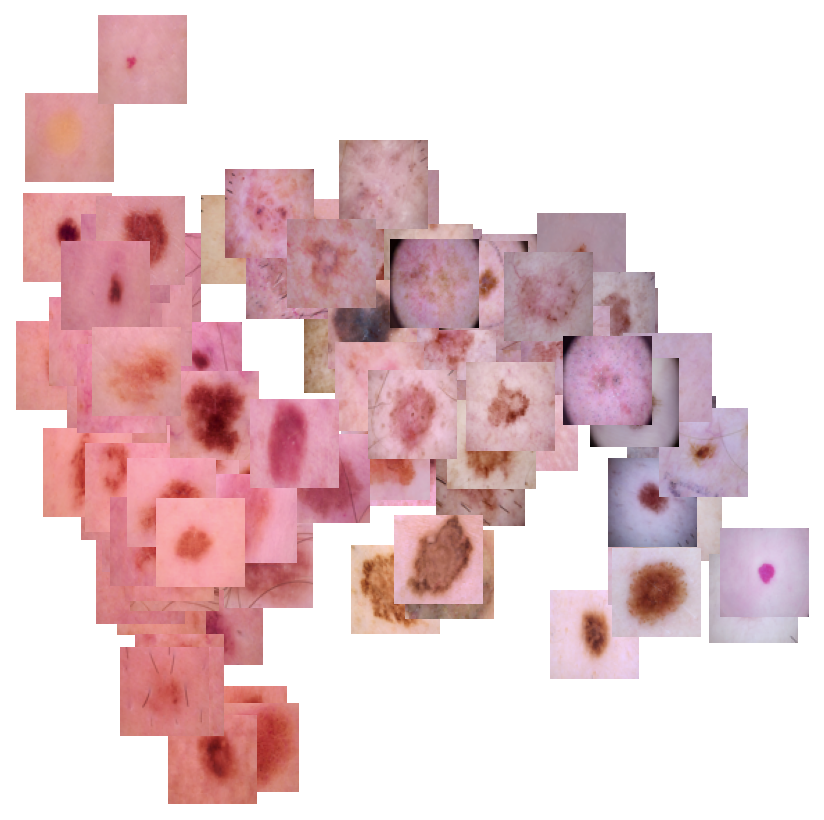

In [25]:
def show_xy_images(in_df, image_zoom=1):
    fig, ax1 = plt.subplots(1,1, figsize=(10, 10))
    artists = []
    for _, c_row in in_df.iterrows():
        c_img = Image.open(c_row['image_path']).resize((64, 64))
        img = OffsetImage(c_img, zoom=image_zoom)
        ab = AnnotationBbox(img, (c_row['x'], c_row['y']), xycoords='data', frameon=False)
        artists.append(ax1.add_artist(ab))
    ax1.update_datalim(in_df[['x', 'y']])
    ax1.autoscale()
    ax1.axis('off')
show_xy_images(image_subset_df)

In [26]:
from sklearn.manifold import TSNE
tsne = TSNE(n_iter=250, verbose=True)
xy_coords = tsne.fit_transform(combined_features)
image_subset_df['x'] = xy_coords[:, 0]
image_subset_df['y'] = xy_coords[:, 1]

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 100 samples in 0.000s...
[t-SNE] Computed neighbors for 100 samples in 0.032s...
[t-SNE] Computed conditional probabilities for sample 100 / 100
[t-SNE] Mean sigma: 0.174865
[t-SNE] KL divergence after 250 iterations with early exaggeration: 51.549221
[t-SNE] KL divergence after 251 iterations: 179769313486231570814527423731704356798070567525844996598917476803157260780028538760589558632766878171540458953514382464234321326889464182768467546703537516986049910576551282076245490090389328944075868508455133942304583236903222948165808559332123348274797826204144723168738177180919299881250404026184124858368.000000


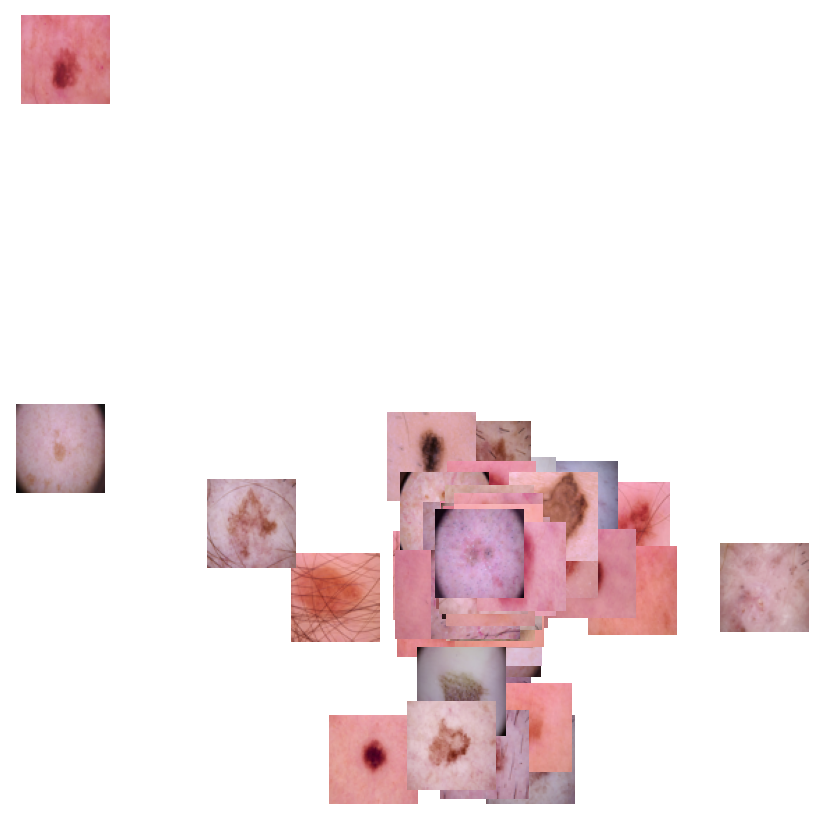

In [27]:
show_xy_images(image_subset_df)

In [28]:
image_overview_df['color_features'] = image_overview_df['image_path'].map(color_count_feature).map(lambda x: x.tolist())
image_overview_df.sample(3)

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
2443,HAM_0005245,ISIC_0024375,vasc,consensus,70.0,female,abdomen,/content/drive/MyDrive/HAM10000_images_part_1/...,vascular lesions,4,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1001,HAM_0003668,ISIC_0024383,bkl,consensus,70.0,female,trunk,/content/drive/MyDrive/HAM10000_images_part_1/...,benign keratosis-like,5,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4349,HAM_0000550,ISIC_0024306,nv,follow_up,45.0,male,trunk,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [29]:
image_overview_df['image_path'] = image_overview_df['image_path'].map(str)

In [30]:

image_overview_df.to_json('color_features.json')

Main code

In [31]:
from pathlib import Path
import numpy as np
import pandas as pd
import os
from skimage.io import imread as imread
from skimage.util import montage
montage_rgb = lambda x: np.stack([montage(x[:, :, :, i]) for i in range(x.shape[3])], -1)
from skimage.color import label2rgb
image_dir = Path('..') / 'input' / 'skin-cancer-mnist-ham10000'
mapping_file = 'color_features.json'
skin_df = pd.read_json(mapping_file)
#skin_df['image_path'] = skin_df['image_path'].map(lambda x: image_dir / 'subset' / x)
print(skin_df['image_path'].map(lambda x: Path(x).exists()).value_counts())
skin_df.sample(10)

image_path
True    231
Name: count, dtype: int64


,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,dx_name,dx_id,color_features
9917,HAM_0006220,ISIC_0024470,akiec,histo,60,male,upper extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,Actinic keratoses and intraepithelial carcinoma,3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3018,HAM_0001287,ISIC_0024535,nv,follow_up,50,male,back,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4908,HAM_0006598,ISIC_0024508,nv,follow_up,50,male,trunk,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
9852,HAM_0005650,ISIC_0024522,akiec,histo,65,male,lower extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,Actinic keratoses and intraepithelial carcinoma,3,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
8383,HAM_0004985,ISIC_0024518,nv,histo,35,female,back,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0007740741000000001, 0.0, 0.0, 0.0, 0.0, 0...."
8295,HAM_0004432,ISIC_0024529,nv,histo,25,male,abdomen,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[1.1111100000000001e-05, 0.0, 0.0, 0.0, 0.0, 0..."
5328,HAM_0003712,ISIC_0024513,nv,follow_up,75,male,upper extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
6895,HAM_0001580,ISIC_0024378,nv,histo,5,male,face,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3401,HAM_0006689,ISIC_0024493,nv,follow_up,40,male,lower extremity,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3788,HAM_0001538,ISIC_0024322,nv,follow_up,65,female,foot,/content/drive/MyDrive/HAM10000_images_part_1/...,melanocytic nevi,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [32]:
from sklearn.model_selection import train_test_split
raw_train_df, valid_df = train_test_split(skin_df,
                 test_size = 0.3,
                  # hack to make stratification work
                 stratify = skin_df['dx_id'])
print(raw_train_df.shape[0], 'training masks')
print(valid_df.shape[0], 'validation masks')

161 training masks
70 validation masks


In [33]:
GAUSSIAN_NOISE = 0.05
# number of validation images to use
VALID_IMG_COUNT = 1500
BASE_MODEL='MobileNet'
IMG_SIZE = (224, 224) # [(224, 224), (384, 384), (512, 512), (640, 640)]
BATCH_SIZE = 64 # [1, 8, 16, 24]
DROPOUT = 0.5
DENSE_COUNT = 256
SAMPLE_PER_GROUP = 2200
LEARN_RATE = 2e-4
EPOCHS = 5
FLATTEN = True
RGB_FLIP = 1 # should rgb be flipped when rendering images

In [34]:
train_df = raw_train_df.\
     groupby('dx_name').\
     apply(lambda x: x.sample(SAMPLE_PER_GROUP//2, replace=True)).\
     reset_index(drop=True)
train_df.shape[0]

7700

In [35]:
from keras.preprocessing.image import ImageDataGenerator
if BASE_MODEL == 'MobileNet':
    from keras.applications.mobilenet_v2 import MobileNetV2 as PTModel, preprocess_input
elif BASE_MODEL=='VGG16':
    from keras.applications.vgg16 import VGG16 as PTModel, preprocess_input
else:
    raise ValueError('Unknown model: {}'.format(BASE_MODEL))

In [36]:
from keras.preprocessing.image import ImageDataGenerator
dg_args = dict(featurewise_center = False,
                  samplewise_center = False,
                  rotation_range = 45,
                  width_shift_range = 0.1,
                  height_shift_range = 0.1,
                  shear_range = 0.01,
                  zoom_range = [0.9, 1.25],
                  brightness_range = [0.7, 1.3],

                  horizontal_flip = True,
                  vertical_flip = False,
                  fill_mode = 'reflect',
                   data_format = 'channels_last',
              preprocessing_function = preprocess_input)

valid_args = dict(fill_mode = 'reflect',
                   data_format = 'channels_last',
                  preprocessing_function = preprocess_input)

core_idg = ImageDataGenerator(**dg_args)
valid_idg = ImageDataGenerator(**valid_args)

In [37]:
def flow_from_dataframe(img_data_gen, raw_df, path_col, y_col, **dflow_args):
    """Keras update makes this much easier"""
    in_df = raw_df.copy()
    in_df[path_col] = in_df[path_col].map(str)
    in_df[y_col] = in_df[y_col].map(lambda x: np.array(x))
    df_gen = img_data_gen.flow_from_dataframe(in_df,
                                              x_col=path_col,
                                              y_col=y_col,
                                    class_mode = 'raw',
                                    **dflow_args)
    # posthoc correction
    df_gen._targets = np.stack(df_gen.labels, 0)
    return df_gen

In [38]:
train_gen = flow_from_dataframe(core_idg, train_df,
                             path_col = 'image_path',
                            y_col = 'dx_id',
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = BATCH_SIZE)

# used a fixed dataset for evaluating the algorithm
valid_x, valid_y = next(flow_from_dataframe(valid_idg,
                               valid_df,
                             path_col = 'image_path',
                            y_col = 'dx_id',
                            target_size = IMG_SIZE,
                             color_mode = 'rgb',
                            batch_size = VALID_IMG_COUNT)) # one big batch
print(valid_x.shape, valid_y.shape)

Found 7700 validated image filenames.
Found 70 validated image filenames.
(70, 224, 224, 3) (70,)


x (64, 224, 224, 3) float32 -1.0 1.0
y (64,) int64 0 6


Text(0.5, 1.0, 'images')

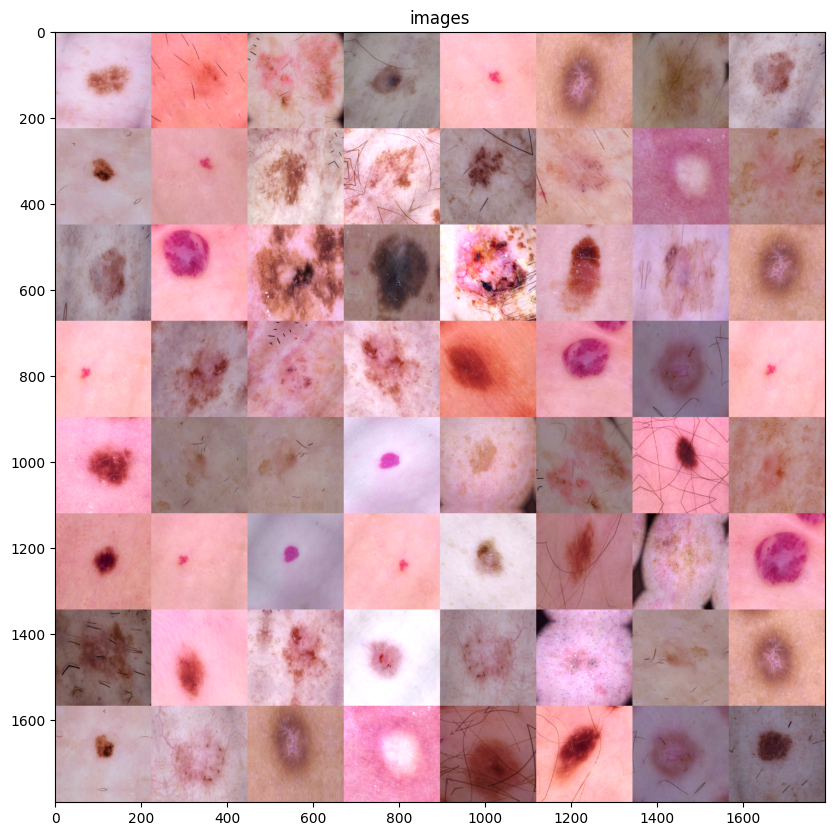

In [39]:
t_x, t_y = next(train_gen)
print('x', t_x.shape, t_x.dtype, t_x.min(), t_x.max())
print('y', t_y.shape, t_y.dtype, t_y.min(), t_y.max())
fig, (ax1) = plt.subplots(1, 1, figsize = (10, 10))
ax1.imshow(montage_rgb((t_x-t_x.min())/(t_x.max()-t_x.min()))[:, :, ::RGB_FLIP])
ax1.set_title('images')

(array([10.,  7.,  0.,  9.,  0., 11., 11.,  0.,  8.,  8.]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <BarContainer object of 10 artists>)

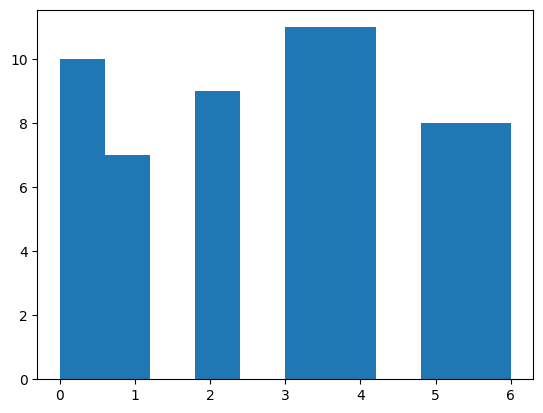

In [40]:
plt.hist(t_y.T)

In [41]:
base_pretrained_model = PTModel(input_shape =  t_x.shape[1:],
                              include_top = False, weights = 'imagenet')
base_pretrained_model.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [42]:
from keras import models, layers
from keras.optimizers import Adam
img_in = layers.Input(t_x.shape[1:], name='Image_RGB_In')
img_noise = layers.GaussianNoise(GAUSSIAN_NOISE)(img_in)
pt_features = base_pretrained_model(img_noise)
pt_depth = base_pretrained_model.get_output_shape_at(0)[-1]
bn_features = layers.BatchNormalization()(pt_features)
feature_dropout = layers.SpatialDropout2D(DROPOUT)(bn_features)
if FLATTEN:
    flat_layer = layers.Flatten()(bn_features)
    collapsed_layer = layers.Dropout(DROPOUT)(flat_layer)
else:
    collapsed_layer = layers.GlobalAvgPool2D()(bn_features)
dr_steps = layers.Dropout(DROPOUT)(layers.Dense(DENSE_COUNT, activation = 'relu')(collapsed_layer))
out_layer = layers.Dense(train_df['dx_id'].max()+1, activation = 'softmax')(dr_steps)

skin_model = models.Model(inputs = [img_in], outputs = [out_layer], name = 'full_model')

skin_model.compile(optimizer = Adam(lr=LEARN_RATE),
                   loss = 'sparse_categorical_crossentropy',
                   metrics = ['sparse_categorical_accuracy'])

skin_model.summary()

Model: "full_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Image_RGB_In (InputLayer)   [(None, 224, 224, 3)]     0         
                                                                 
 gaussian_noise (GaussianNo  (None, 224, 224, 3)       0         
 ise)                                                            
                                                                 
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 batch_normalization (Batch  (None, 7, 7, 1280)        5120      
 Normalization)                                                  
                                                                 
 flatten (Flatten)           (None, 62720)             0         
                                                        

In [43]:
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}_weights.best.hdf5".format('skin_cancer_detector')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = True)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.8, patience=10, verbose=1, mode='auto', epsilon=0.0001, cooldown=5, min_lr=0.0001)
early = EarlyStopping(monitor="val_loss",
                      mode="min",
                      patience=15) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [46]:

from IPython.display import clear_output
train_gen.batch_size = BATCH_SIZE
fit_results = skin_model.fit_generator(train_gen,
                            steps_per_epoch = train_gen.samples//BATCH_SIZE,
                      validation_data = (valid_x, valid_y),
                      epochs = EPOCHS,
                      callbacks = callbacks_list,
                      workers = 3)

<ipython-input-46-bfb805a650f2>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  fit_results = skin_model.fit_generator(train_gen,


Epoch 1/5
120/120 [==============================] - ETA: 0s - loss: 0.1257 - sparse_categorical_accuracy: 0.9746
Epoch 1: val_loss did not improve from 3.88993
120/120 [==============================] - 159s 1s/step - loss: 0.1257 - sparse_categorical_accuracy: 0.9746 - val_loss: 5.0896 - val_sparse_categorical_accuracy: 0.5000 - lr: 0.0010
Epoch 2/5
120/120 [==============================] - ETA: 0s - loss: 0.1737 - sparse_categorical_accuracy: 0.9763
Epoch 2: val_loss did not improve from 3.88993
120/120 [==============================] - 161s 1s/step - loss: 0.1737 - sparse_categorical_accuracy: 0.9763 - val_loss: 5.4808 - val_sparse_categorical_accuracy: 0.6429 - lr: 0.0010
Epoch 3/5
120/120 [==============================] - ETA: 0s - loss: 0.1094 - sparse_categorical_accuracy: 0.9797
Epoch 3: val_loss did not improve from 3.88993
120/120 [==============================] - 160s 1s/step - loss: 0.1094 - sparse_categorical_accuracy: 0.9797 - val_loss: 8.0051 - val_sparse_categorica

(0.0, 1.0)

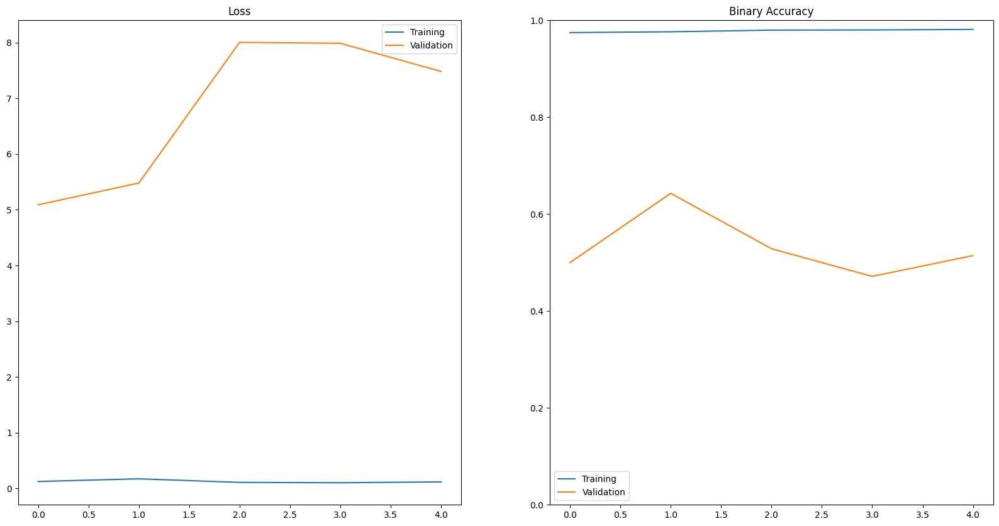

In [47]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 10))
ax1.plot(fit_results.history['loss'], label='Training')
ax1.plot(fit_results.history['val_loss'], label='Validation')
ax1.legend()
ax1.set_title('Loss')
ax2.plot(fit_results.history['sparse_categorical_accuracy'], label='Training')
ax2.plot(fit_results.history['val_sparse_categorical_accuracy'], label='Validation')
ax2.legend()
ax2.set_title('Binary Accuracy')
ax2.set_ylim(0, 1)

In [59]:
# Load the weights into the model
skin_model.load_weights(weight_path)

# Define the full path where you want to save the model
model_save_path = '/content/drive/MyDrive/HAM10000_images_part_1/full_skin_cancer_model.keras'

# Save the model to the specified path
skin_model.save(model_save_path)


In [60]:
for k, v in zip(skin_model.metrics_names,
        skin_model.evaluate(valid_x, valid_y)):
    if k!='loss':
        print('{:40s}:\t{:2.1f}%'.format(k, 100*v))

3/3 [==============================] - 0s 39ms/step - loss: 3.8899 - sparse_categorical_accuracy: 0.6429
sparse_categorical_accuracy             :	64.3%


In [61]:
dx_lookup_dict = train_df[['dx_name', 'dx_id']].drop_duplicates().set_index('dx_id').to_dict()['dx_name']

2/2 [==============================] - 0s 48ms/step


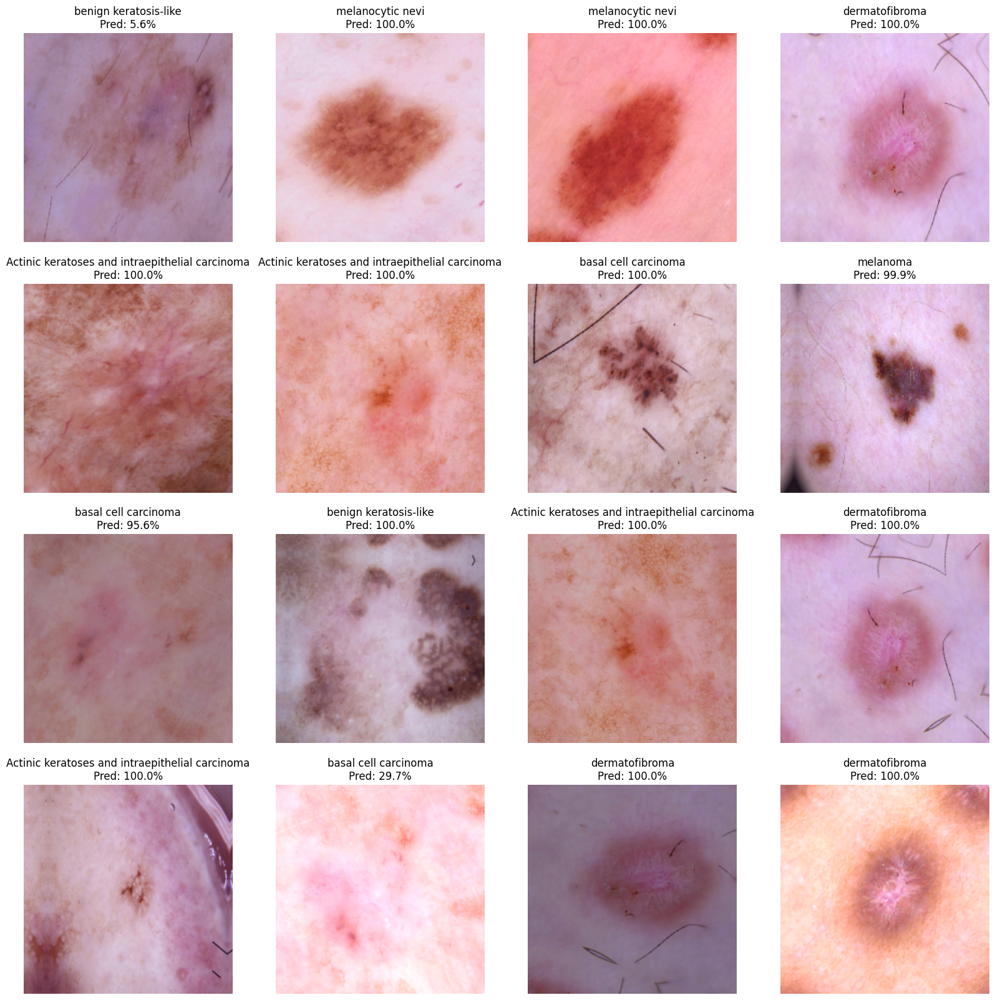

In [62]:
t_x, t_y = next(train_gen)
t_yp = skin_model.predict(t_x)
fig, (m_axs) = plt.subplots(4, 4, figsize = (20, 20))
for i, c_ax in enumerate(m_axs.flatten()):
    c_ax.imshow(((t_x[i]-t_x.min())/(t_x.max()-t_x.min()))[:, ::RGB_FLIP])
    c_title = '{}\nPred: {:2.1f}%'.format(dx_lookup_dict[t_y[i]], 100*t_yp[i, t_y[i]])
    c_ax.set_title(c_title)
    c_ax.axis('off')

9/9 [==============================] - 2s 12ms/step


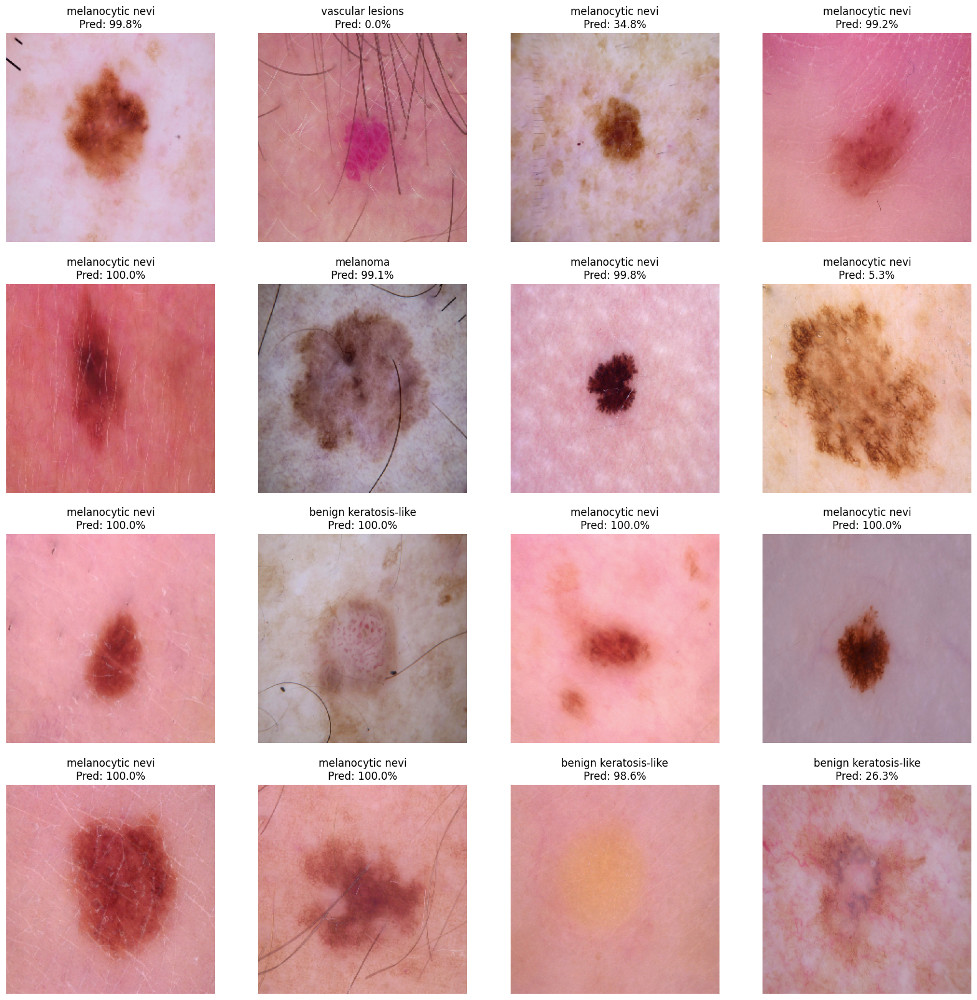

In [53]:
t_x, t_y = valid_x, valid_y
t_yp = skin_model.predict(t_x, batch_size=8, verbose=True)
fig, (m_axs) = plt.subplots(4, 4, figsize = (20, 20))
for i, c_ax in enumerate(m_axs.flatten()):
    c_ax.imshow(((t_x[i]-t_x.min())/(t_x.max()-t_x.min()))[:, ::RGB_FLIP])
    c_title = '{}\nPred: {:2.1f}%'.format(dx_lookup_dict[t_y[i]], 100*t_yp[i, t_y[i]])
    c_ax.set_title(c_title)
    c_ax.axis('off')

In [54]:
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import f1_score, recall_score, precision_score, classification_report


In [64]:
# Load the model
model = load_model('/content/drive/MyDrive/HAM10000_images_part_1/full_skin_cancer_model.keras')

# Predict classes
predictions = model.predict(valid_x)
predictions = np.argmax(predictions, axis=1)  # Convert probabilities to class labels


3/3 [==============================] - 1s 47ms/step


In [65]:
# Assuming valid_y is your true labels
f1 = f1_score(valid_y, predictions, average='macro')
recall = recall_score(valid_y, predictions, average='macro')
precision = precision_score(valid_y, predictions, average='macro')

print("Precision: {:.4f}".format(precision))
print("Recall: {:.4f}".format(recall))
print("F1 Score: {:.4f}".format(f1))


Precision: 0.3238
Recall: 0.3690
F1 Score: 0.3296


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [66]:
print(classification_report(valid_y, predictions))


              precision    recall  f1-score   support

           0       0.90      0.76      0.82        46
           1       0.25      0.20      0.22         5
           2       0.50      0.40      0.44         5
           3       0.29      0.67      0.40         3
           4       0.00      0.00      0.00         1
           5       0.33      0.56      0.42         9
           6       0.00      0.00      0.00         1

    accuracy                           0.64        70
   macro avg       0.32      0.37      0.33        70
weighted avg       0.70      0.64      0.66        70



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
